# Датасет

In [1]:
import torch
import cv2
import json
import numpy as np
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from image_processing import load_image
from pathlib import Path


class CustomDataset(Dataset):

    def __init__(self, images: list[str] | list[np.ndarray], image_parameters: list[tuple[float, float, float]], target_size: tuple[int, int] | None=None, loaded: bool=False):
        self.loaded = loaded
        if loaded:
            self.images = images
        else:
            self.image_paths = images
        self.image_parameters = image_parameters
        self.target_size = target_size

    def __len__(self):
        return len(self.image_parameters)

    def __getitem__(self, index):
        if not self.loaded:
            image = cv2.imread(self.image_paths[index])
            if image is None:
                raise FileNotFoundError(f"{self.image_paths[index]} not found.")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        else:
            image = self.images[index]

        if self.target_size is not None:
            image = cv2.resize(image, self.target_size, interpolation=cv2.INTER_AREA)
        image = image.astype(np.float32) / 255.0
        image_tensor = torch.from_numpy(image).permute(2, 0, 1)

        return image_tensor, torch.tensor(self.image_parameters[index], dtype=torch.float32)
    

def load_data(
        dataset_file: str,
        load_into_memory: bool,
        target_size: tuple[int, int] | None=None,
        max_iter: int | None=None
    ) -> dict[str, list]:
    
    if load_into_memory:
        images = []
    image_paths = []
    image_parameters = []
    
    with open(dataset_file, "r") as file:
        data = json.load(file)

    for i, obj in enumerate(data):
        if "raw_image" in obj:
            image_path = obj["raw_image"]
        elif "image_path" in obj:
            image_path = obj["image_path"]
        else:
            image_path = obj["resized_image_path"]

        brightness = obj["brightness"]
        contrast = obj["contrast"]
        saturation = obj["saturation"]

        if load_into_memory:
            cur_image = load_image(image_path, target_size=target_size, to_rgb=True)
            images.append(cur_image)

        image_paths.append(image_path)
        image_parameters.append((brightness, contrast, saturation))

        if max_iter and (i + 1) == max_iter:
            break
    
    result = {"image_paths": image_paths, "image_parameters": image_parameters}
    if load_into_memory:
        result.update({"images": images})
    
    return result
    

def create_and_split_dataset(
        dataset_file: str,
        train_size: float=0.7,
        val_size: float=0.2,
        test_size: float=0.1,
        image_target_size: tuple[int, int] | None=None,
        load_into_memory: bool=False,
        save_partition_in_file: bool=False,
        save_folder: str | None=None,
        save_file_postfix: str | None=None,
        max_iter: int | None=None,
        random_state: int=42
    ) -> tuple[CustomDataset, CustomDataset, CustomDataset]:
    
    if not Path(dataset_file).exists():
        raise FileNotFoundError(f"{dataset_file} not found.")
    
    if not dataset_file.endswith(".json"):
        raise Exception(f"{dataset_file} is not .json file.")
    
    if round(train_size + test_size + val_size, 2) != 1:
        raise ValueError(f"Incorrect partition: {train_size} + {test_size} + {val_size} != 1.")
    
    if save_folder is not None:
        Path(save_folder).mkdir(exist_ok=True)
    
    image_data = load_data(dataset_file, load_into_memory, image_target_size, max_iter)

    image_parameters = np.array(image_data["image_parameters"])
    if load_into_memory:
        main_image_data = np.array(image_data["images"])
    else:
        main_image_data = np.array(image_data["image_paths"])
    
    if save_partition_in_file:
        image_paths = np.array(image_data["image_paths"])
    
    indexes = np.array(np.arange(len(main_image_data)), dtype=np.int32)

    train_indexes, temp_indexes = train_test_split(indexes, train_size=train_size, random_state=random_state, shuffle=True)
    
    test_size, val_size = test_size / (test_size + val_size), val_size / (test_size + val_size)
    val_indexes, test_indexes = train_test_split(temp_indexes, train_size=val_size, random_state=random_state, shuffle=True)
    
    train_image_data = main_image_data[train_indexes]
    train_image_parameters = image_parameters[train_indexes]

    val_image_data = main_image_data[val_indexes]
    val_image_parameters = image_parameters[val_indexes]

    test_image_data = main_image_data[test_indexes]
    test_image_parameters = image_parameters[test_indexes]

    if save_partition_in_file:
        train_paths = image_paths[train_indexes]
        val_paths = image_paths[val_indexes]
        test_paths = image_paths[test_indexes]

        data_for_file = [("train", train_paths, train_image_parameters), ("val", val_paths, val_image_parameters), ("test", test_paths, test_image_parameters)]
        for file_name, image_paths, image_parameters_ in data_for_file:
            if save_folder is not None:
                file_path = f"{save_folder}/"

            file_path += f"{file_name}_data"

            if save_file_postfix:
                file_path += f"_{save_file_postfix}"

            file_path += '.json'

            data = []

            for image_path, image_parameter in zip(image_paths, image_parameters_):

                data.append({
                    "image_path": image_path,
                    "brightness": image_parameter[0],
                    "contrast": image_parameter[1],
                    "saturation": image_parameter[2]
                })

            with open(file_path, "w") as file:
                json.dump(data, file, indent=2)

    train_dataset = CustomDataset(train_image_data, train_image_parameters, target_size=image_target_size, loaded=load_into_memory)
    val_dataset = CustomDataset(val_image_data, val_image_parameters, target_size=image_target_size, loaded=load_into_memory)
    test_dataset = CustomDataset(test_image_data, test_image_parameters, target_size=image_target_size, loaded=load_into_memory)

    return train_dataset, val_dataset, test_dataset


def create_dataloader(dataset: CustomDataset, batch_size: int) -> DataLoader:
    return DataLoader(dataset, batch_size, shuffle=True, pin_memory=True)

# Обучение модели

In [2]:
from torch.utils.data import DataLoader
from torch.optim import Optimizer, lr_scheduler
from torch import save as save_model
from CSRNet import EnhanceNet
from pathlib import Path
from time import time


def calculate_mae(y_true: np.ndarray[float], y_pred: np.ndarray[float]) -> float:
    return (y_true - y_pred).abs().sum(dim=0).detach().cpu()


def run_epoch(model: EnhanceNet, loader: DataLoader, criterion: torch.nn.MSELoss, optimizer: Optimizer, device: torch.device, train: bool):
    model.train(mode=train)
    total_loss = 0.0
    total_mae = torch.zeros(3)

    with torch.set_grad_enabled(train):
        for images, targets in loader:
            images, targets = images.to(device), targets.to(device)

            predictions = model(images)
            loss = criterion(predictions, targets)

            if train:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            total_loss += loss.item() * images.size(0)
            total_mae += calculate_mae(targets, predictions)

    n = len(loader.dataset)
    avg_loss = total_loss / n
    avg_mae = total_mae / n
    return avg_loss, avg_mae

def fit(
        model: EnhanceNet,
        train_loader: DataLoader,
        val_loader: DataLoader,
        optimizer: Optimizer,
        criterion: torch.nn.MSELoss,
        scheduler: lr_scheduler,
        epochs: int,
        device: torch.device,
        save_models_dir: str,
        patience: int = 10,
        verbose: bool=True
    ) -> tuple[EnhanceNet, dict[str, list[float]]]:

    Path(save_models_dir).mkdir(exist_ok=True)
    experiment_folders = [int(folder.name) for folder in Path(save_models_dir).iterdir()]
    if len(experiment_folders) == 0:
        save_path = f"{save_models_dir}/1"
    else:
        save_path = f"{save_models_dir}/{max(experiment_folders) + 1}"
    Path(save_path).mkdir(exist_ok=True)

    best_val_loss = float("inf")
    epochs_without_improvement = 0

    history = {
        "train_loss": [],
        "train_mae": [],
        "val_loss": [],
        "val_mae": []
    }

    for epoch in range(epochs):

        start = time()

        train_loss, train_mae = run_epoch(model, train_loader, criterion, optimizer, device, train=True)
        val_loss, val_mae = run_epoch(model, val_loader, criterion, optimizer, device, train=False)
        scheduler.step(val_loss)

        history["train_loss"].append(train_loss)
        history["train_mae"].append(train_mae)
        history["val_loss"].append(val_loss)
        history["val_mae"].append(val_mae)

        end = time()

        if verbose:
            time_delta = end - start
            if time_delta > 60:
                print(f"Epoch {epoch+1} {time_delta // 60:.0f} min. {time_delta % 60:.0f} sec.")
            else:
                print(f"Epoch {epoch+1} {time_delta:.0f} sec.")
            print(f"\ttrain_loss {train_loss:.5f} | val_loss {val_loss:.5f} | val_mae b/c/s {val_mae[0]:.4f}/{val_mae[1]:.4f}/{val_mae[2]:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improvement = 0

            output_path = f"{save_path}/Model_epoch_{epoch + 1}_TrainLoss_{train_loss:.2f}_ValLoss_{val_loss:.2f}.pt"
            save_model(model.state_dict(), output_path)
            if verbose:
                print(f"Epoch {epoch + 1} saved best model")
        else:
            epochs_without_improvement += 1
            if epochs_without_improvement >= patience:
                print(f"Early stopping: no improvement for {patience} epochs")
                break

    return model, history

In [3]:
import matplotlib.pyplot as plt



def plot_history(history: dict[str, list[float]]):
    n_rows = 1
    n_cols = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, 5))
    axes = axes.flatten()

    axes[0].plot(history["train_loss"], label="train loss")
    axes[0].plot(history["val_loss"], label="val loss")
    axes[0].legend()
    axes[0].set_title("MSE")

    brightness = [[], []]
    contrast = [[], []]
    saturation = [[], []]
    for i, metric in enumerate(["train_mae", "val_mae"]):
        for values in history[metric]:
            brightness[i].append(values[0])
            contrast[i].append(values[1])
            saturation[i].append(values[2])
    
    for i, (parameter_name, parameter_values) in enumerate([("brightness", brightness), ("contrast", contrast), ("saturation", saturation)]):
        for j, episode_name in enumerate(["train", "val"]):
            axes[i + 1].plot(parameter_values[j], label=f"{episode_name} mae")
        
        axes[i + 1].legend()
        axes[i + 1].set_title(parameter_name.upper())

### Synthetic

In [ ]:
batch_size = 256

train_dataset, val_dataset, test_dataset = create_and_split_dataset(
    "./artefacts/optimization_dataset.json",
    load_into_memory=True,
    image_target_size=(256, 256),
    save_partition_in_file=True,
    save_folder="./artefacts",
    save_file_postfix="synthetic"
)
train_loader = create_dataloader(train_dataset, batch_size)
val_loader = create_dataloader(val_dataset, batch_size)
test_loader = create_dataloader(test_dataset, batch_size)

In [7]:
from CSRNet import EnhanceNet
from torch.nn import MSELoss
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.cuda import is_available
from torch import device


epochs = 25
lr = 1e-3

cur_device = device("cuda" if is_available() else "cpu")
model = EnhanceNet().to(cur_device)
criterion = MSELoss()
optimizer = Adam(model.parameters(), lr=lr, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3)

trained_model, history = fit(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs, cur_device, "./experiments")

Epoch 1 5 sec.
	train_loss 0.16403 | val_loss 0.06311 | val_mae b/c/s 0.2274/0.2021/0.1946
Epoch 1 saved best model
Epoch 2 4 sec.
	train_loss 0.06895 | val_loss 0.05905 | val_mae b/c/s 0.2302/0.1877/0.1827
Epoch 2 saved best model
Epoch 3 5 sec.
	train_loss 0.06194 | val_loss 0.05642 | val_mae b/c/s 0.2302/0.1799/0.1775
Epoch 3 saved best model
Epoch 4 5 sec.
	train_loss 0.05903 | val_loss 0.05519 | val_mae b/c/s 0.2291/0.1800/0.1738
Epoch 4 saved best model
Epoch 5 5 sec.
	train_loss 0.05764 | val_loss 0.05395 | val_mae b/c/s 0.2343/0.1766/0.1637
Epoch 5 saved best model
Epoch 6 5 sec.
	train_loss 0.05623 | val_loss 0.05348 | val_mae b/c/s 0.2393/0.1735/0.1587
Epoch 6 saved best model
Epoch 7 5 sec.
	train_loss 0.05563 | val_loss 0.05352 | val_mae b/c/s 0.2419/0.1713/0.1571
Epoch 8 5 sec.
	train_loss 0.05562 | val_loss 0.05247 | val_mae b/c/s 0.2378/0.1704/0.1570
Epoch 8 saved best model
Epoch 9 5 sec.
	train_loss 0.05491 | val_loss 0.05239 | val_mae b/c/s 0.2404/0.1694/0.1557
Epoch 

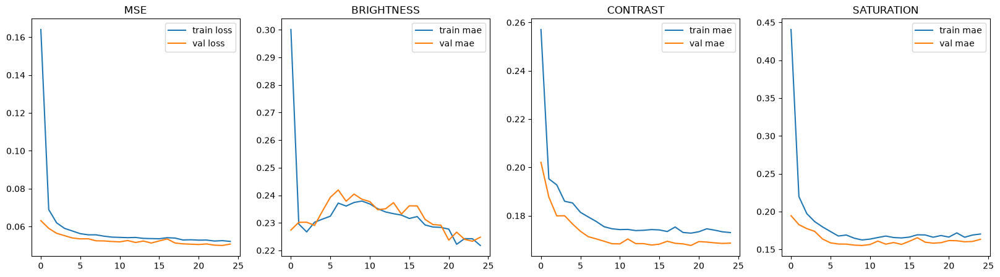

In [8]:
plot_history(history)

### Synthetic bootstrap

In [ ]:
batch_size = 256

train_dataset, val_dataset, test_dataset = create_and_split_dataset(
    "./artefacts/optimization_dataset_bootstap.json",
    load_into_memory=True,
    image_target_size=(256, 256),
    save_partition_in_file=True,
    save_folder="./artefacts",
    save_file_postfix="synthetic_bootstrap"
)
train_loader = create_dataloader(train_dataset, batch_size)
val_loader = create_dataloader(val_dataset, batch_size)
test_loader = create_dataloader(test_dataset, batch_size)

In [17]:
from CSRNet import EnhanceNet
from torch.nn import MSELoss
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.cuda import is_available
from torch import device


epochs = 15
lr = 1e-3

cur_device = device("cuda" if is_available() else "cpu")
model = EnhanceNet().to(cur_device)
criterion = MSELoss()
optimizer = Adam(model.parameters(), lr=lr, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3)

trained_model, history = fit(model, train_loader, val_loader, optimizer, criterion, scheduler, epochs, cur_device, "./experiments")

Epoch 1 5 sec.
	train_loss 0.19651 | val_loss 0.03614 | val_mae b/c/s 0.1359/0.1613/0.1629
Epoch 1 saved best model
Epoch 2 5 sec.
	train_loss 0.05481 | val_loss 0.03577 | val_mae b/c/s 0.1515/0.1643/0.1465
Epoch 2 saved best model
Epoch 3 5 sec.
	train_loss 0.04244 | val_loss 0.03620 | val_mae b/c/s 0.1438/0.1594/0.1615
Epoch 4 5 sec.
	train_loss 0.03836 | val_loss 0.03008 | val_mae b/c/s 0.1355/0.1454/0.1370
Epoch 4 saved best model
Epoch 5 5 sec.
	train_loss 0.03422 | val_loss 0.02726 | val_mae b/c/s 0.1290/0.1358/0.1291
Epoch 5 saved best model
Epoch 6 5 sec.
	train_loss 0.03162 | val_loss 0.02524 | val_mae b/c/s 0.1298/0.1289/0.1209
Epoch 6 saved best model
Epoch 7 5 sec.
	train_loss 0.02996 | val_loss 0.02404 | val_mae b/c/s 0.1349/0.1218/0.1153
Epoch 7 saved best model
Epoch 8 5 sec.
	train_loss 0.02841 | val_loss 0.02243 | val_mae b/c/s 0.1366/0.1146/0.1084
Epoch 8 saved best model
Epoch 9 5 sec.
	train_loss 0.02791 | val_loss 0.02118 | val_mae b/c/s 0.1358/0.1038/0.1041
Epoch 

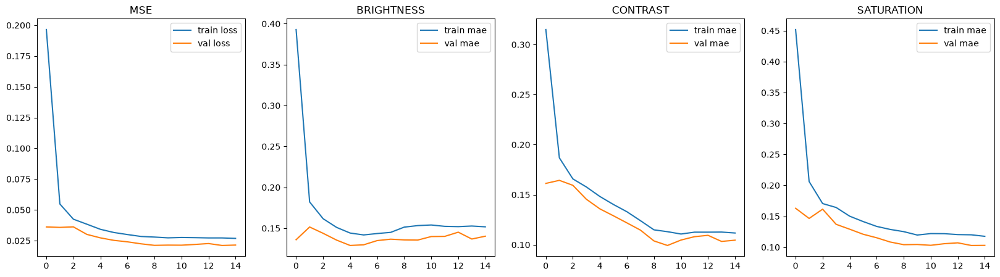

In [18]:
plot_history(history)

# Оценка модели

## Оценка метрик предсказания модели

In [4]:
import torch
from CSRNet import EnhanceNet
from torch.utils.data import DataLoader
from torch.nn import MSELoss


def evaluate_model(model: EnhanceNet, test_loader: DataLoader, criterion: MSELoss, device: torch.device):

    model.eval()
    with torch.inference_mode():

        total_loss = 0
        total_mae = torch.zeros(3)
        for images, targets in test_loader:
            images, targets = images.to(device), targets.to(device)

            predictions = model(images)

            loss = criterion(predictions, targets)

            total_loss += loss.item() * images.size(0)
            total_mae += calculate_mae(targets, predictions)

        n = len(test_loader.dataset)
        avg_loss = total_loss / n
        avg_mae = total_mae / n

    print(f"MSE: {avg_loss:.4f};\nMAE: b/c/s {avg_mae[0]:.4f}/{avg_mae[1]:.4f}/{avg_mae[2]:.4f}")

### Synthetic

In [46]:
import torch
from CSRNet import EnhanceNet


test_data = load_data("./artefacts/test_data_synthetic.json", load_into_memory=True, target_size=(256, 256))
test_dataset = CustomDataset(test_data["images"], test_data["image_parameters"], loaded=True)
test_loader = create_dataloader(test_dataset, batch_size=256)

device = "cpu"
model = EnhanceNet().to(device)
weights = torch.load("./experiments/32/Model_epoch_20_TrainLoss_0.05_ValLoss_0.05.pt", weights_only=True)
model.load_state_dict(weights)

<All keys matched successfully>

In [10]:
evaluate_model(model, test_loader, MSELoss(), device)

MSE: 0.0490;
MAE: b/c/s 0.2205/0.1778/0.1506


### Synthetic bootstrap

In [19]:
import torch
from CSRNet import EnhanceNet


test_data = load_data("./artefacts/test_data_synthetic_bootstrap.json", load_into_memory=True, target_size=(256, 256))
test_dataset = CustomDataset(test_data["images"], test_data["image_parameters"], loaded=True)
test_loader = create_dataloader(test_dataset, batch_size=256)

device = "cpu"
model = EnhanceNet().to(device)
weights = torch.load("./experiments/33/Model_epoch_9_TrainLoss_0.03_ValLoss_0.02.pt", weights_only=True)
model.load_state_dict(weights)

<All keys matched successfully>

In [20]:
evaluate_model(model, test_loader, MSELoss(), device)

MSE: 0.0208;
MAE: b/c/s 0.1360/0.0980/0.1038


## Оценка схожести изображений после преобразования

In [23]:
import torch
import cv2
import json
import numpy as np
import matplotlib.pyplot as plt
from CSRNet import EnhanceNet
from multiprocessing import Pool, cpu_count
from pathlib import Path
from tqdm import tqdm

from image_processing import load_image, compare_metrics, load_pair, apply_params
from CSRNet import EnhanceNet, INPUT_SIZE


def compare_images(
        model: EnhanceNet,
        device: torch.device | str,
        dataset_file: str | None,
        dataset_path: str="./dataset",
        expert: str="c",
        target_size: tuple[int, int] | None=None,
        show_images: bool=False,
        n_images: int=5,
        max_iter: int | None=None,
        n_workers: int=-1
    ):
    dataset_path = Path(dataset_path)
    if not dataset_path.exists():
        raise Exception(f"There is no folder like {dataset_path}.")
    
    if not dataset_path.is_dir():
        raise Exception(f"{dataset_path} is not folder.")
    
    has_expert = False
    for folder in dataset_path.iterdir():
        if folder.name == expert:
            if not any(folder.iterdir()):
                raise Exception(f"Folder {expert} is empty.")
            has_expert = True
    
    if not has_expert:
        raise Exception(f"There is no {expert} folder in {dataset_path}.")
    
    if not dataset_file.endswith(".json"):
        raise ValueError(f"{dataset_file} is not .json file.")

    corrupted_image_paths = []
    resized_corrupted_image_paths = []
    expert_image_paths = []

    with open(dataset_file, "r") as file:
        data = json.load(file)

    for i, obj in enumerate(data):
        if "raw_image" in obj:
            corrupted_image_path = obj["raw_image"]
            resized_corrupted_image_path = obj["image_path"]
        elif "image_path" in obj:
            corrupted_image_path = obj["image_path"]
            resized_corrupted_image_path = obj["image_path"]
        else:
            corrupted_image_path = obj["resized_image_path"]
            resized_corrupted_image_path = obj["image_path"]

        image_name = Path(corrupted_image_path).name
        expert_image_path = f"./{dataset_path}/{expert}/{image_name}"

        corrupted_image_paths.append(corrupted_image_path)
        resized_corrupted_image_paths.append(resized_corrupted_image_path)
        expert_image_paths.append(expert_image_path)

        if max_iter is not None and (i + 1) == max_iter:
            break

    predicted_parameters = []
    
    model.eval()
    with torch.inference_mode():
        for image_path in resized_corrupted_image_paths:
            image = load_image(image_path, target_size, to_tensor=True)
            image = image.to(device).unsqueeze(0)

            parameters = model(image)
            predicted_parameters.append(parameters[0].cpu().tolist())

    iter_params = [
        (corrupted_image_path, expert_image_path, image_parameters)
        for corrupted_image_path, expert_image_path, image_parameters
        in zip(corrupted_image_paths, expert_image_paths, predicted_parameters)
    ]
    
    n_workers = n_workers if n_workers != -1 else cpu_count()
    total_psnr = 0.0
    total_ssim = 0.0
    total_delta_e = 0.0
    with Pool(n_workers) as pool:
        for result in tqdm(pool.imap_unordered(compare_metrics, iter_params), total=len(iter_params)):
            if "error" in result:
                print(result["error"])
                continue

            total_psnr += result["psnr"]
            total_ssim += result["ssim"]
            total_delta_e += result["delta_e"]
    
    n = len(iter_params)
    avg_psnr = total_psnr / n
    avg_ssim = total_ssim / n
    avg_delta_e = total_delta_e / n

    print(f"METRICS:\n\tPSNR: {avg_psnr:.2f}\n\tSSIM: {avg_ssim:.2f}\n\tDELTA E: {avg_delta_e}")

    if not show_images:
        return
    
    n_cols = 3
    fig_width = 15
    n_rows = n_images
    fig_height = 5 * n_rows
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(fig_width, fig_height))
    axes = axes.flatten()

    indexes = np.random.choice(np.arange(len(corrupted_image_paths)), n_images, replace=False)
    for i, idx in enumerate(indexes):
        corrupted_image_path = corrupted_image_paths[idx]
        expert_image_path = expert_image_paths[idx]
        brightness, contrast, saturation = predicted_parameters[idx]

        corrupted_image, expert_image = load_pair(corrupted_image_path, expert_image_path)
        reconstructed_image = apply_params(corrupted_image, brightness, contrast, saturation)
        
        corrupted_image = cv2.cvtColor(corrupted_image, cv2.COLOR_BGR2RGB)
        reconstructed_image = cv2.cvtColor(reconstructed_image, cv2.COLOR_BGR2RGB)
        expert_image = cv2.cvtColor(expert_image, cv2.COLOR_BGR2RGB)

        axes[i * 3].imshow(corrupted_image)
        axes[i * 3 + 1].imshow(reconstructed_image)
        axes[i * 3 + 2].imshow(expert_image)

        axes[i * 3].axis("off")
        axes[i * 3 + 1].axis("off")
        axes[i * 3 + 2].axis("off")

        axes[i * 3].set_title("corrupted")
        axes[i * 3 + 1].set_title("reconstucted")
        axes[i * 3 + 2].set_title("expert")


def compare_external_images(model: EnhanceNet):
    image_path_1 = "D:\\Stuff\\Bateman.png"
    image_path_2 = "C:\\Users\\Busyaska\\Downloads\\20200624_135924.jpg"
    image_path_3 = "C:\\Users\\Busyaska\\Downloads\\20200618_190226.jpg"
    image_path_4 = "C:\\Users\\Busyaska\\Downloads\\20200730_203205.jpg"

    test_image_paths = [image_path_1, image_path_2, image_path_3, image_path_4]

    fig, axes = plt.subplots(ncols=2, nrows=len(test_image_paths), figsize=(12, len(test_image_paths)*3.5))
    axes = axes.flatten()

    model.eval()
    with torch.inference_mode():
        for i, image_path in enumerate(test_image_paths):
            image = load_image(image_path)
            resized_image = load_image(image_path, (INPUT_SIZE, INPUT_SIZE), to_tensor=True)
            resized_image = resized_image.to(device).unsqueeze(0)

            parameters = model(resized_image)
            brightness, contrast, saturation = parameters[0].cpu().tolist()

            enhanced_image = apply_params(image, brightness, contrast, saturation)

            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB)

            axes[i * 2].imshow(image)
            axes[i * 2 + 1].imshow(enhanced_image)

            axes[i * 2].axis("off")
            axes[i * 2 + 1].axis("off")

            axes[i * 2].set_title("original")
            axes[i * 2 + 1].set_title(f"enhanced\nbrightness: {brightness:.2f}, contrast: {contrast:.2f}, saturation: {saturation:.2f}")

    plt.suptitle("Model work examples", fontsize=20)
    

### Synthetic

In [25]:
import torch
from CSRNet import EnhanceNet


device = "cpu"
model = EnhanceNet().to(device)
weights = torch.load("./experiments/32/Model_epoch_20_TrainLoss_0.05_ValLoss_0.05.pt", weights_only=True)
model.load_state_dict(weights)

<All keys matched successfully>

100%|██████████| 500/500 [00:08<00:00, 59.45it/s]


METRICS:
	PSNR: 19.42
	SSIM: 0.82
	DELTA E: 10.067175797700882


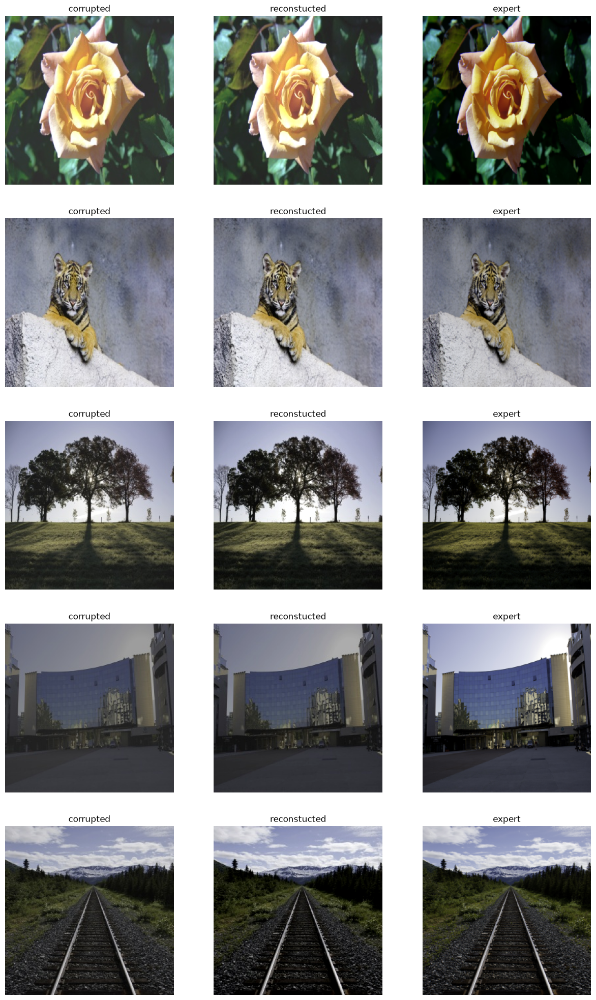

In [14]:
compare_images(
    model,
    device,
    dataset_file="./artefacts/test_data_synthetic.json",
    target_size=(256, 256),
    show_images=True,
    n_workers=8,
)

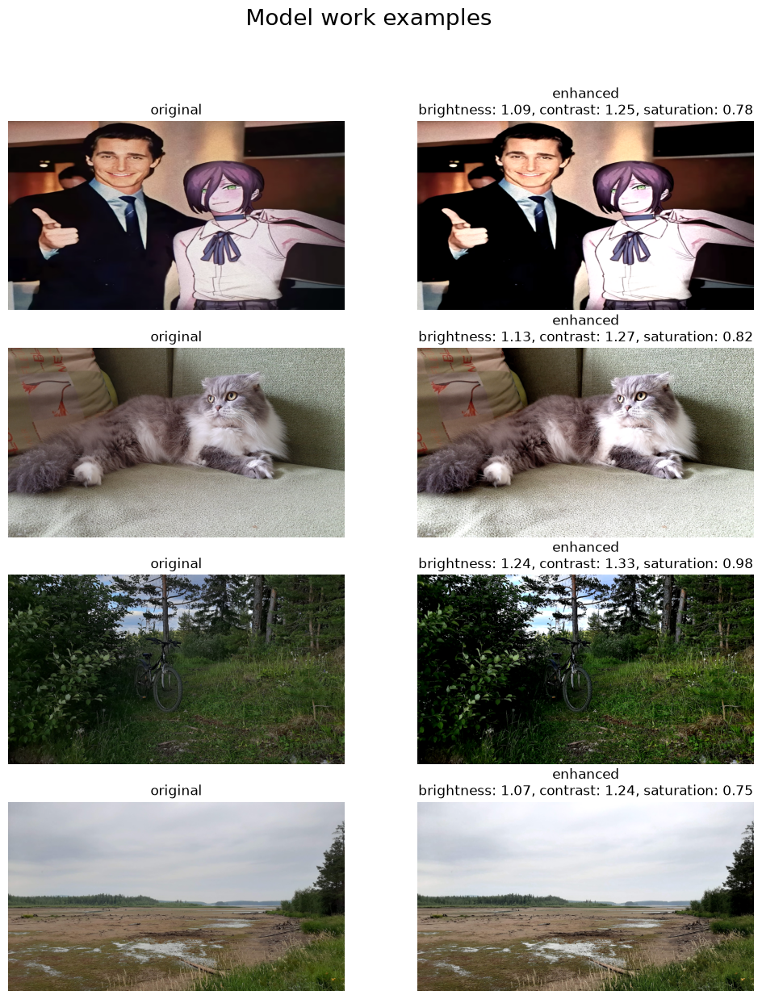

In [26]:
compare_external_images(model)

### Synthetic bootstrap

In [19]:
import torch
from CSRNet import EnhanceNet


device = "cpu"
model = EnhanceNet().to(device)
weights = torch.load("./experiments/33/Model_epoch_9_TrainLoss_0.03_ValLoss_0.02.pt", weights_only=True)
model.load_state_dict(weights)

<All keys matched successfully>

100%|██████████| 500/500 [00:09<00:00, 54.60it/s]


METRICS:
	PSNR: 24.17
	SSIM: 0.89
	DELTA E: 6.036942376852036


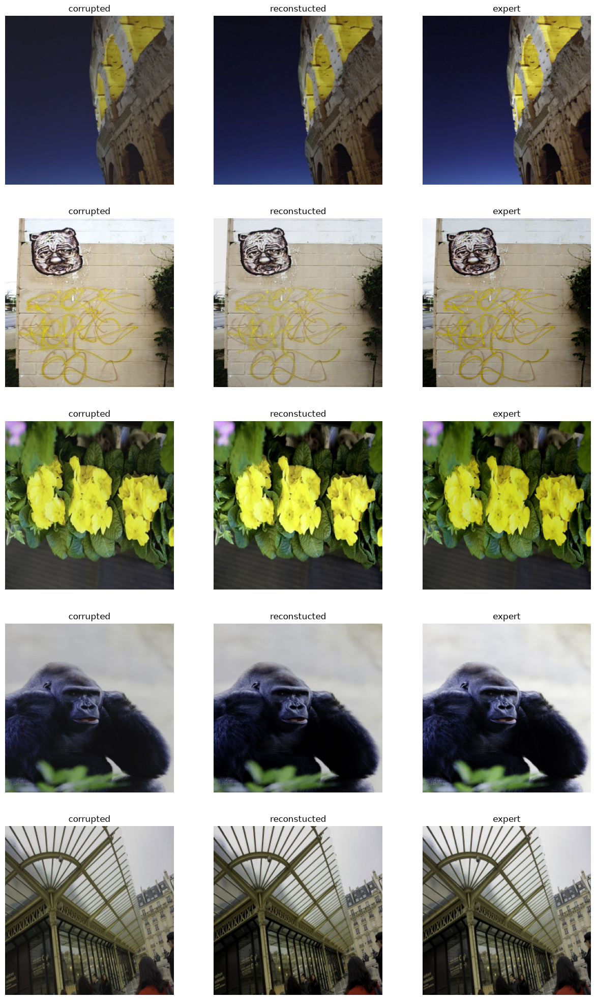

In [13]:
compare_images(
    model,
    device,
    dataset_file="./artefacts/test_data_synthetic_bootstrap.json",
    target_size=(256, 256),
    show_images=True,
    n_workers=8
)

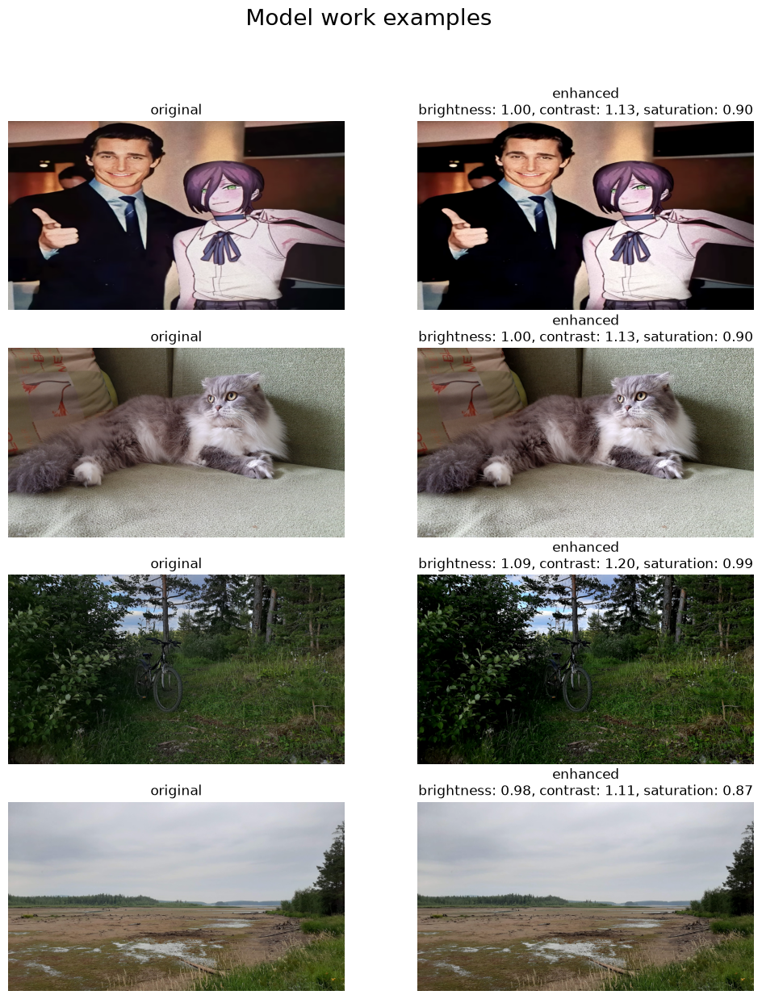

In [24]:
compare_external_images(model)

## Вывод


**Обе модели с достаточно высокой точностью предсказывают значения: метрика схожести двух изображений SSIM у обоих моделей показывает значение > 80%.**
**Однако, модель, обученная на наборе данных Synthetic bootstrap, превосходит по всем метрикам вторую модель, поэтому вдальнейшем будет использоваться она.**
| Metric | Synthetic | Synthetic bootstrap |
| --- | --- | --- |
| PSNR | 19.42 | 24.17 |
| SSIM | 0.82 | 0.89 |
| DELTA E | 10.07 | 6.04 |

# Конвертация модели в ONNX для работы в браузере

In [ ]:
import torch
import onnx
from CSRNet import INPUT_SIZE


model = EnhanceNet()
model.load_state_dict(torch.load("./experiments/33/Model_epoch_9_TrainLoss_0.03_ValLoss_0.02.pt", map_location="cpu"))
model.eval()

dummy_input = torch.rand(1, 3, INPUT_SIZE, INPUT_SIZE)

dynamic_axes = {}

torch.onnx.export(
    model,
    dummy_input,
    "best_model.onnx",
    export_params=True,
    opset_version=17,
    do_constant_folding=True,
    input_names=["image"],
    output_names=["params"],
    dynamic_axes={
        "image": {0: "batch"},
        "params": {0: "batch"}
    },
    dynamo=False
)

onnx_model = onnx.load("best_model.onnx")
onnx.checker.check_model(onnx_model)
print("Model converted.")

Model converted.


C:\Users\Busyaska\AppData\Local\Temp\ipykernel_11188\1225270294.py:14: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter has become the default. Learn more about the new export logic: https://docs.pytorch.org/docs/stable/onnx_export.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html
  torch.onnx.export(
